# EDC 3: Ekimetrics - AI for Sustainability
**Hypothèses:** 
- TO des camions
- Routes les plus empruntées => plot sur une map

**DataViz:** 
- Chloropleth 
- Plot Warehouses

In [1]:
# Set full width on jupyter notebook navigator
from IPython.core.display import HTML, display

display(HTML("<style>.container { width:100% !important; }</style>"))

# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
import numpy as np

sns.set_style('ticks')
pd.set_option('display.max_columns', 500) #display all the columns of a dataframe when doing df.head()

## Import data

In [3]:
cities = pd.read_csv("C:/Users/Administrateur/Desktop/MentionCentrale/MMF/EKIMETRICS/cities.csv")
factors = pd.read_csv("C:/Users/Administrateur/Desktop/MentionCentrale/MMF/EKIMETRICS/factors.csv")
orders = pd.read_csv("C:/Users/Administrateur/Desktop/MentionCentrale/MMF/EKIMETRICS/orders.csv")
packages = pd.read_csv("C:/Users/Administrateur/Desktop/MentionCentrale/MMF/EKIMETRICS/packages.csv")
pricing = pd.read_csv("C:/Users/Administrateur/Desktop/MentionCentrale/MMF/EKIMETRICS/pricing.csv")
routes = pd.read_csv("C:/Users/Administrateur/Desktop/MentionCentrale/MMF/EKIMETRICS/routes_v2.csv")
trucks = pd.read_csv("C:/Users/Administrateur/Desktop/MentionCentrale/MMF/EKIMETRICS/trucks.csv")
warehouses = pd.read_csv("C:/Users/Administrateur/Desktop/MentionCentrale/MMF/EKIMETRICS/warehouses.csv")

## Traitement des données
- Missing values
- Wrong values (Courbevoic au lieu de Courbevoie)
- Issue with the 'aBCDNfWx5TAkxbTTmQJEE4' package - package_volume = 113.8 mismatch in `packages` and package_volume = 0.1138 `order`
- 4 missing values in `packages.package_revenues`

#### 1- Cleaning routes

In [4]:
routes_cleaned = routes.copy()
routes_cleaned.stops = routes.apply(lambda x: x.stops.split(' > '), axis=1)
routes_cleaned.orders = routes.apply(lambda x: x.orders.split(' > '), axis=1)
routes_cleaned.head(1)

,truck_id,duration,fill_volume,n_units,orders,from_warehouse,route_date,stops,total_distance
0,jehwGBpNg2rDLeKoYeiaLs,2.167136,5.9879,87.0,"[nK4iPf8nrGA9yivRH66ehS, jnsH9ndQ3UKcWSbb2UMkFn]",Clermont-Ferrand,2021-01-02,"[Clermont-Ferrand, Bourges]",153.950611


In [5]:
packages_cleaned = packages.copy()

#On commence par corriger la valeur du package de volume buggé
packages_cleaned.loc[packages_cleaned['package_id']=='aBCDNfWx5TAkxbTTmQJEE4','package_volume'] = 0.1138

#On corrige tous les prix pour les accorder au pricing selon le volume - tient compte des missing values en price
packages_cleaned['threshold'] = packages_cleaned.apply(lambda x: min(pricing.max_volume.values, key=lambda y:max(0,x.package_volume-y)) ,axis=1)

packages_cleaned = pd.merge(packages_cleaned,pricing[['max_volume','pricing']], left_on='threshold', right_on='max_volume')
packages_cleaned.loc[packages_cleaned['package_revenues']!=packages_cleaned['pricing'],'package_revenues'] = packages_cleaned['pricing']

#On ne garde que les colonnes pertinentes
packages_cleaned = packages_cleaned[packages.columns]

## Questions répondues par la data:

#### 1 - Quels sont les endroits les plus livrés ? 

In [6]:
pck_volume_per_city = orders.groupby('delivery_location').aggregate({'package_volume':'sum'}).sort_values('package_volume',ascending=False)
pck_volume_per_city.head(5)

,package_volume
delivery_location,
Boulogne-sur-Mer,230.7196
Le Mans,229.7817
La Rochelle,229.4900
Tourcoing,226.9872
Courbevoic,225.7096


In [7]:
from urllib.request import urlopen
import json
import geopandas as gpd

with urlopen('https://raw.githubusercontent.com/gregoiredavid/france-geojson/master/departements-version-simplifiee.geojson') as response:
    french_counties = json.load(response)
    geo_data = pd.DataFrame(gpd.GeoDataFrame(french_counties['features'])['properties'].tolist())
    geo_data['value']= 1

In [8]:
import plotly.graph_objects as go

pck_volume_per_city = orders.groupby('delivery_location').aggregate({'package_volume':'sum'}).sort_values('package_volume',ascending=False)
pck_volume_per_city = pd.merge(cities,pck_volume_per_city, left_on='city', right_index=True)

pck_volume_per_city['text'] = pck_volume_per_city['city'] + ', ' + 'Package_Volume: ' + round(pck_volume_per_city['package_volume']).astype(str)

trace0 = go.Choropleth(
    locations=geo_data['code'],
    geojson=french_counties,
    autocolorscale=False,
    z=geo_data['value'],
    featureidkey='properties.code', 
    showscale=False,
    marker_line_color='black',
    colorscale=[[0, "rgb(255,255,255)"],
                [1, "rgb(240,240,240)"]])

trace1 = data=go.Scattergeo(
        lon = pck_volume_per_city['lng'],
        lat = pck_volume_per_city['lat'],
        mode = 'markers',
        geojson= french_counties,
        text = pck_volume_per_city['text'],
        marker_color = pck_volume_per_city['package_volume'],
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = False,
            autocolorscale = False,
            symbol = 'square',
            line = dict(width=1,
                        color='rgba(102, 102, 102)'),
            colorscale = 'Reds',
            cmin = 150,
            color = pck_volume_per_city['package_volume'],
            cmax = pck_volume_per_city['package_volume'].max(),
            colorbar_title="Package Volume delivered<br>"),)

fig = go.Figure(data=[trace0,
                     trace1,
                     ])

fig.update_geos(fitbounds="locations", 
                visible=False,
                #showcountries=True,
                #showsubunits=True,
                #showocean=True,
                showlakes=True,
                oceancolor='#bfd7ed',
                #showland = True,
                landcolor = "rgb(250, 250, 250)",)

fig.update_layout(
        title = 'Most delivered city in France by LPD',
        geo_scope='europe',
    )

fig.show()

#### 2-Les routes les plus empruntées

In [9]:
used_tracks = []
for i in range(len(routes_cleaned)):
    for j in range(len(routes_cleaned.stops[i])-1):
        used_tracks += [[routes_cleaned.stops[i][j] + ' - ' + routes_cleaned.stops[i][j+1],
                         routes_cleaned.stops[i][j],
                         routes_cleaned.stops[i][j+1],
                         routes_cleaned.route_date[i],
                        routes_cleaned.from_warehouse[i]]]
used_tracks = (pd.DataFrame(used_tracks,columns=['routes','start','stop','date', 'from_warehouse']))

In [10]:
routes_used = (used_tracks
               .groupby(['routes','start','stop', 'from_warehouse'])
               .agg({'routes':'count'})
               .rename(columns={'routes':'nb_routes'})
               .sort_values("nb_routes"))

routes_used = pd.merge(routes_used.reset_index(), cities[['city','lat','lng']], 
                       left_on='start',right_on='city')

routes_used = (routes_used
               .rename(columns={'lat':'lat_start','lng':'lng_start'})
               .drop(columns=['city']))

routes_used = pd.merge(routes_used.reset_index(), cities[['city','lat','lng']], 
                       left_on='stop',right_on='city')

routes_used = (routes_used
               .rename(columns={'lat':'lat_stop','lng':'lng_stop'})
               .drop(columns=['city']))

routes_used.head()

,index,routes,start,stop,from_warehouse,nb_routes,lat_start,lng_start,lat_stop,lng_stop
0,0,Caen - Beauvais,Caen,Beauvais,Cergy,1,49.1800,-0.3700,49.4303,2.0952
1,180,Boulogne-Billancourt - Beauvais,Boulogne-Billancourt,Beauvais,Cergy,108,48.8352,2.2409,49.4303,2.0952
2,258,Boulogne-sur-Mer - Beauvais,Boulogne-sur-Mer,Beauvais,Cergy,14,50.7264,1.6147,49.4303,2.0952
3,272,Brest - Beauvais,Brest,Beauvais,Cergy,4,48.3900,-4.4900,49.4303,2.0952
4,347,Cergy - Beauvais,Cergy,Beauvais,Cergy,74,49.0361,2.0631,49.4303,2.0952


In [11]:
import plotly.graph_objects as go

pck_volume_per_city = orders.groupby('delivery_location').aggregate({'package_volume':'sum'}).sort_values('package_volume',ascending=False)
pck_volume_per_city = pd.merge(cities,pck_volume_per_city, left_on='city', right_index=True)

pck_volume_per_city['text'] = pck_volume_per_city['city'] + ', ' + 'Package_Volume: ' + round(pck_volume_per_city['package_volume']).astype(str)

trace = go.Choropleth(
    locations=geo_data['code'],
    geojson=french_counties,
    autocolorscale=False,
    z=geo_data['value'],
    featureidkey='properties.code', 
    showscale=False,
    marker_line_color='black',
    colorscale=[[0, "rgb(255,255,255)"],
                [1, "rgb(240,240,240)"]],
    showlegend=False)

fig = go.Figure(data=trace)

for i in range(len(routes_used)):
    fig.add_trace(go.Scattergeo(
                        lat = [routes_used.lat_start[i],routes_used.lat_stop[i]],
                        lon = [routes_used.lng_start[i],routes_used.lng_stop[i]],
                        mode = 'lines',
                        line = dict(width = routes_used.nb_routes[i]/50, color="grey"), 
                        showlegend=False
                        ))


fig.add_trace(go.Scattergeo(
        lon = pck_volume_per_city['lng'],
        lat = pck_volume_per_city['lat'],
        mode = 'markers',
        geojson= french_counties,
        text = pck_volume_per_city['text'],
        marker_color = pck_volume_per_city['package_volume'],
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = False,
            autocolorscale = False,
            symbol = 'square',
            line = dict(width=1,
                        color='rgba(102, 102, 102)'),
            colorscale = 'Reds',
            cmin = 150,
            color = pck_volume_per_city['package_volume'],
            cmax = pck_volume_per_city['package_volume'].max(),
            colorbar_title="Package Volume delivered<br>"),
        showlegend=False),
            )

fig.update_geos(fitbounds="locations", 
                visible=False,
                landcolor = "rgb(240, 240, 240)",)

fig.update_layout(
        title = 'Most used routes by LPD',
        geo_scope='europe',
    )

#### 3 - Taux de remplissage des camions

In [12]:
tr_trucks = pd.merge(routes_cleaned,trucks, right_on='truck_id', left_on='truck_id')
tr_trucks["fill_ratio"] = (tr_trucks['fill_volume'])/tr_trucks['truck_volume']

print("Le taux de remplissage total des camions est de: %.2f " % (tr_trucks["fill_ratio"].mean()*100) +'%')

Le taux de remplissage total des camions est de: 75.25 %


**Tension par warehouse**

In [13]:
tr_trucks.groupby("truck_warehouse").agg({"fill_ratio":'mean'}).sort_values('fill_ratio',ascending=False)

,fill_ratio
truck_warehouse,
Cergy,0.770519
Reims,0.749822
Avignon,0.743516
Montauban,0.731426
Clermont-Ferrand,0.671110


#### 7 - GLOBAL KPIs

In [14]:
# we get the key metrics to assess the performance of our company

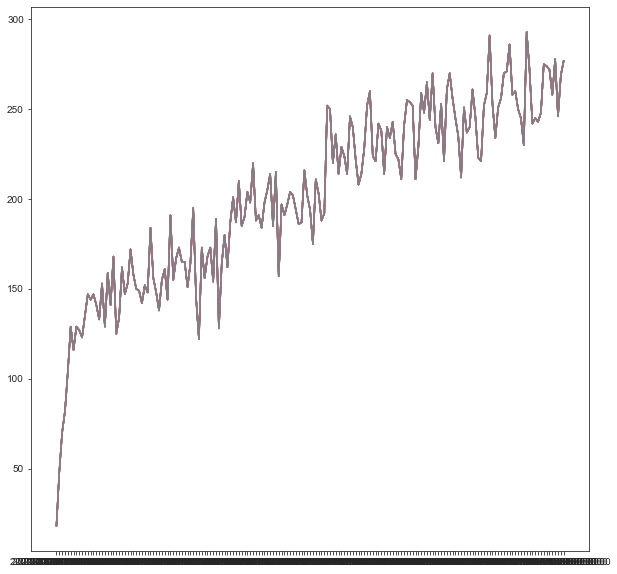

In [15]:
plt.figure(figsize=(10,10))
plt.plot(orders.groupby('delivered_date').count())

In [16]:
packages_cleaned['package_revenues'].sum()

1466.6000000000001

In [17]:
len(orders['delivery_location'].drop_duplicates())

100

#### 8 - ROUTES KPIs

In [18]:
# how to optimize something ?
# check all routes and find the optimal routes : in euros, in volume, in number of trucks, in number of orders, in CO2 consommation

In [19]:
# km parcourus par camion
# quels sont les camions sous-utilisés ?

In [20]:
a = routes_cleaned.groupby('truck_id')['duration'].apply(sum).sort_values(ascending=True)

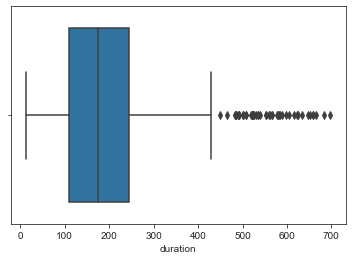

In [21]:
ax = sns.boxplot(x=a)

In [22]:
a.sort_values(ascending=False).head(10)

truck_id
8XCqdfzWkCyrBJQzqCCfCM    697.499394
VXGz8WBqzaqhUdLPD9ZuKc    683.806127
93ZXB3UY9QiLtm85bjG5Fp    665.146480
5nYoqzUpcuKCxHcJud5XnP    658.946146
3Pf3ceQMzsEd5uwkwkor4W    658.909820
ab4DZJocvLCcsEAxayPHSq    652.757155
dqErCz8reYpMSiP6KpyGt4    647.995869
nVFrbdAtjeuNm9ErK2wusU    632.995117
6HdXXZ3c2fN4ckEtvKJaXQ    625.351730
RpuwvLKV835N5rP72KkzoQ    622.186772
Name: duration, dtype: float64

In [23]:
# tracer les cartes des routes

C:\Users\Administrateur\anaconda3\envs\geo_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='fill_volume'>

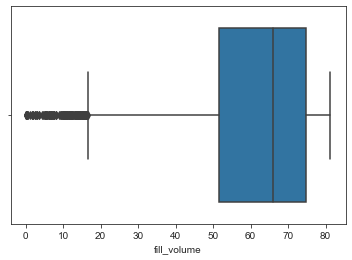

In [24]:
sns.boxplot(routes_cleaned['fill_volume'])

In [25]:
# camions vides ?
avg_fill = routes_cleaned.groupby(by='truck_id')[['fill_volume', 'duration']].mean()

In [26]:
# les pires camions sont ceux pour lesquels le taux fill_volume/duration est le plus élevé
avg_fill['camion_utility'] = avg_fill['fill_volume']/avg_fill['duration']

In [27]:
avg_fill.sort_values(by='camion_utility', ascending=False).head()

,fill_volume,duration,camion_utility
truck_id,,,
UxYU9N4W9NpFhreoyMjinV,53.834157,2.830751,19.017627
EdVhJixgYLZKWNDhgQw83R,53.514080,2.815200,19.008979
JXBm6JCPs49HQ3FWaymLaJ,67.081800,3.882548,17.277779
22T9Um92znQQzNZ6zpNibT,55.894120,3.262834,17.130544
guLHFrco4jvMmi5M2LEqCS,56.190422,3.323747,16.905747


C:\Users\Administrateur\anaconda3\envs\geo_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



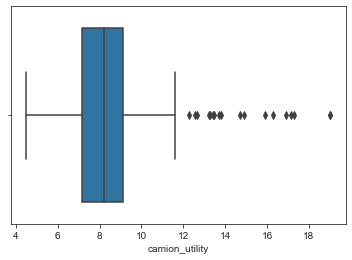

In [28]:
axes = sns.boxplot(avg_fill['camion_utility'])

In [29]:
routes_cleaned[routes_cleaned['truck_id']=='hBXDUWPMCb8hSzYaUm2phr'].head()

,truck_id,duration,fill_volume,n_units,orders,from_warehouse,route_date,stops,total_distance
53,hBXDUWPMCb8hSzYaUm2phr,4.604167,10.4908,120.0,"[ACYQWFTz4iMYnG373wwRFg, 3gPLnsRBP4ywfJACPGpX9...",Clermont-Ferrand,2021-01-08,"[Clermont-Ferrand, Villeurbanne, Lyon, Clermon...",279.003559
3028,hBXDUWPMCb8hSzYaUm2phr,2.321399,10.7001,58.0,"[F4NA2DPCFqvc8pFeSvabhX, Lg75MKVBdAhgG9QdRtzKHC]",Clermont-Ferrand,2021-04-02,[Clermont-Ferrand],0.000000
3182,hBXDUWPMCb8hSzYaUm2phr,1.927128,62.0868,31.0,[HK8BS9PKU6F7goaxpA8sPb],Clermont-Ferrand,2021-04-06,[Clermont-Ferrand],0.000000
3721,hBXDUWPMCb8hSzYaUm2phr,3.603051,79.3548,126.0,"[dKshADnrQMtsqzY3LKwgor, NvxBrHq4VX4d9JbkmyP4e...",Clermont-Ferrand,2021-04-18,[Clermont-Ferrand],0.000000
4341,hBXDUWPMCb8hSzYaUm2phr,3.450346,33.8639,97.0,"[J4UnrLqoxPxbVeux9FXrDY, gyfdP8UG77PDfs8euHFXY...",Clermont-Ferrand,2021-05-01,"[Clermont-Ferrand, Villeurbanne, Saint-Étienne]",192.513769


In [30]:
# remplissage des camions au fur et à mesure

In [31]:
b = routes_cleaned[['truck_id', 'route_date', 'orders', 'stops', 'fill_volume']]
b['route_id'] = b['truck_id'] + b['route_date']

b = b.explode('orders')

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_9496/2457450419.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [32]:
c = orders[['order_id', 'delivery_location', 'package_volume', 'order_date', 'order_total_volume']]

In [33]:
b['order_id'] = b['orders']
del b['orders']

In [34]:
b = b.reset_index()
del b['index']

In [35]:
df = pd.merge(b, c, on="order_id")

In [36]:
df.head()

,truck_id,route_date,stops,fill_volume,route_id,order_id,delivery_location,package_volume,order_date,order_total_volume
0,jehwGBpNg2rDLeKoYeiaLs,2021-01-02,"[Clermont-Ferrand, Bourges]",5.9879,jehwGBpNg2rDLeKoYeiaLs2021-01-02,nK4iPf8nrGA9yivRH66ehS,Clermont-Ferrand,0.0020,2021-01-01,0.0800
1,jehwGBpNg2rDLeKoYeiaLs,2021-01-02,"[Clermont-Ferrand, Bourges]",5.9879,jehwGBpNg2rDLeKoYeiaLs2021-01-02,jnsH9ndQ3UKcWSbb2UMkFn,Bourges,0.1257,2021-01-01,5.9079
2,XnzFnkALW3tLnzrdCVFyKH,2021-01-02,"[Cergy, Saint-Nazaire, Saint-Denis, Rouen, Mon...",4.7060,XnzFnkALW3tLnzrdCVFyKH2021-01-02,XHfAWaLxTFbo5UQwtd7CMz,Saint-Nazaire,0.0020,2021-01-01,0.0860
3,XnzFnkALW3tLnzrdCVFyKH,2021-01-02,"[Cergy, Saint-Nazaire, Saint-Denis, Rouen, Mon...",4.7060,XnzFnkALW3tLnzrdCVFyKH2021-01-02,Wd6rPc4wPRNmt3ruf3F7oL,Saint-Nazaire,0.1630,2021-01-01,0.9780
4,XnzFnkALW3tLnzrdCVFyKH,2021-01-02,"[Cergy, Saint-Nazaire, Saint-Denis, Rouen, Mon...",4.7060,XnzFnkALW3tLnzrdCVFyKH2021-01-02,2MFgV2VC4UhnHBwS24i5aN,Saint-Denis,0.0485,2021-01-01,0.3880


In [37]:
# we can aggregate by truck_id and route_date : this gives us one route

In [38]:
gg = df.sort_values(['truck_id', 'route_date'])

In [39]:
# add a column that count the number of the traject

In [40]:
gg['number_trajet'] = df.groupby(['truck_id','route_date']).cumcount()+1

In [41]:
gg.head(5)

,truck_id,route_date,stops,fill_volume,route_id,order_id,delivery_location,package_volume,order_date,order_total_volume,number_trajet
1946,22T9Um92znQQzNZ6zpNibT,2021-01-19,"[Clermont-Ferrand, Villeurbanne]",67.5936,22T9Um92znQQzNZ6zpNibT2021-01-19,h9azhiBKhxG4cvTBq6tNwu,Villeurbanne,1.8776,2021-01-12,67.5936,1
2670,22T9Um92znQQzNZ6zpNibT,2021-01-24,"[Clermont-Ferrand, Saint-Étienne, Lyon, Clermo...",55.8895,22T9Um92znQQzNZ6zpNibT2021-01-24,CawVQZViq3o3PNzPyydQ2r,Saint-Étienne,1.4152,2021-01-17,28.3040,1
2671,22T9Um92znQQzNZ6zpNibT,2021-01-24,"[Clermont-Ferrand, Saint-Étienne, Lyon, Clermo...",55.8895,22T9Um92znQQzNZ6zpNibT2021-01-24,WMQgRoZmAyhFbskFNWNiqf,Saint-Étienne,0.2867,2021-01-22,12.9015,2
2672,22T9Um92znQQzNZ6zpNibT,2021-01-24,"[Clermont-Ferrand, Saint-Étienne, Lyon, Clermo...",55.8895,22T9Um92znQQzNZ6zpNibT2021-01-24,krmxUJnkTFMwqV3dQ6MNa9,Lyon,0.0485,2021-01-21,1.0670,3
2673,22T9Um92znQQzNZ6zpNibT,2021-01-24,"[Clermont-Ferrand, Saint-Étienne, Lyon, Clermo...",55.8895,22T9Um92znQQzNZ6zpNibT2021-01-24,CVhwhKLB6yaEcW8Qs3Tg5e,Clermont-Ferrand,2.7234,2021-01-14,13.6170,4


In [42]:
# gg is the correct dataframe

In [43]:
# on calcule le remplissage exact de chaque camion en fonction du numéro de l'arrêt
gg['volume_at_trajet_i'] = gg.groupby(['truck_id','route_date'])['order_total_volume'].cumsum().tolist()
gg['fill_volume_trajet'] = gg['fill_volume'] - gg['volume_at_trajet_i']

In [44]:
gg.head()

,truck_id,route_date,stops,fill_volume,route_id,order_id,delivery_location,package_volume,order_date,order_total_volume,number_trajet,volume_at_trajet_i,fill_volume_trajet
1946,22T9Um92znQQzNZ6zpNibT,2021-01-19,"[Clermont-Ferrand, Villeurbanne]",67.5936,22T9Um92znQQzNZ6zpNibT2021-01-19,h9azhiBKhxG4cvTBq6tNwu,Villeurbanne,1.8776,2021-01-12,67.5936,1,67.5936,0.0000
2670,22T9Um92znQQzNZ6zpNibT,2021-01-24,"[Clermont-Ferrand, Saint-Étienne, Lyon, Clermo...",55.8895,22T9Um92znQQzNZ6zpNibT2021-01-24,CawVQZViq3o3PNzPyydQ2r,Saint-Étienne,1.4152,2021-01-17,28.3040,1,28.3040,27.5855
2671,22T9Um92znQQzNZ6zpNibT,2021-01-24,"[Clermont-Ferrand, Saint-Étienne, Lyon, Clermo...",55.8895,22T9Um92znQQzNZ6zpNibT2021-01-24,WMQgRoZmAyhFbskFNWNiqf,Saint-Étienne,0.2867,2021-01-22,12.9015,2,41.2055,14.6840
2672,22T9Um92znQQzNZ6zpNibT,2021-01-24,"[Clermont-Ferrand, Saint-Étienne, Lyon, Clermo...",55.8895,22T9Um92znQQzNZ6zpNibT2021-01-24,krmxUJnkTFMwqV3dQ6MNa9,Lyon,0.0485,2021-01-21,1.0670,3,42.2725,13.6170
2673,22T9Um92znQQzNZ6zpNibT,2021-01-24,"[Clermont-Ferrand, Saint-Étienne, Lyon, Clermo...",55.8895,22T9Um92znQQzNZ6zpNibT2021-01-24,CVhwhKLB6yaEcW8Qs3Tg5e,Clermont-Ferrand,2.7234,2021-01-14,13.6170,4,55.8895,0.0000


In [45]:
final = gg.groupby('number_trajet')['fill_volume_trajet'].mean().reset_index()

<AxesSubplot:xlabel='number_trajet', ylabel='fill_volume_trajet'>

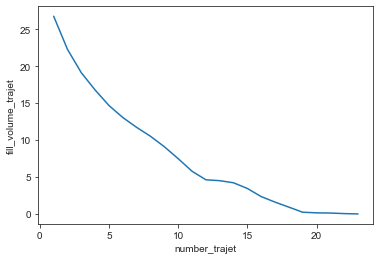

In [46]:
sns.lineplot(data=final, x='number_trajet', y='fill_volume_trajet')

In [47]:
gg['fill_volume'].mean()

63.57300677257756

In [48]:
# fill volume

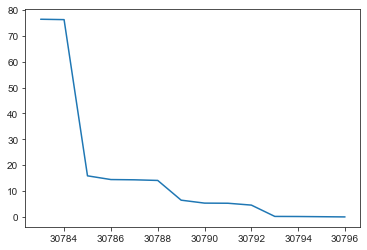

In [49]:
plt.plot(gg[gg['route_id']=='Xr7rmuyMyt7o8rwgmG6LTy2021-06-09']['fill_volume_trajet'])

In [50]:
# active truck per day


# ROUTES OPTIMIZATION

In [51]:
# comment optimiser les routes ?
# algorithme de distribution du flow ? chaque colis doit être livré à un endroit précis

In [52]:
# on souhaite avoir toutes les routes

In [53]:
gg['delivery_delay'] = (pd.to_datetime(gg['route_date']) - pd.to_datetime(gg['order_date'])).dt.days

C:\Users\Administrateur\anaconda3\envs\geo_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:ylabel='count'>

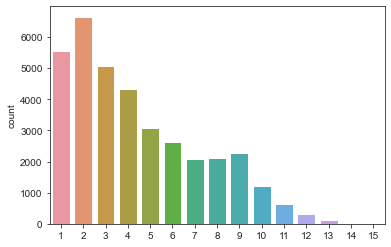

In [54]:
sns.countplot(gg['delivery_delay'].tolist())

In [55]:
# tous les ordres d'un jour j

In [56]:
len(orders[orders['order_date']=='2021-01-04'])

171

In [57]:
len(routes_cleaned)

7426

In [58]:
# on me donne un ordre avec une destination
# je dois livrer l'ordre le plus vite possible

In [59]:
# est-ce que les destinations de chaque route sont optimales ?

In [60]:
orders.head()

,order_id,package_id,package_volume,delivery_location,from_warehouse,order_date,delivered_date,n_units,order_total_volume
0,EtPmaD3APj8aRNeSC3Yx7R,Z8722BWG8WfyrU3jeWsWGo,0.2732,Nice,Avignon,2021-01-01,2021-01-04 00:00:00,27.0,7.3764
1,4X4RBUwTXGBMVWdEj8Gti4,4oxrPXkner2kvXqvLQiCXF,0.2384,Issy-les-Moulineaux,Cergy,2021-01-01,2021-01-03 00:00:00,41.0,9.7744
2,GDhuTcBnr9xdRhFb2jLYcW,mnEb7xGXa9dFMLPAkrZZoh,1.4152,Toulouse,Montauban,2021-01-01,2021-01-08 00:00:00,35.0,49.5320
3,3EZDvpzw5DdxXyJ66Py75J,3nwbxBUemtMG75cVPs7q7R,1.3451,Poitiers,Montauban,2021-01-01,2021-01-09 00:00:00,21.0,28.2471
4,Fpvw9NfnexSxjzLvyPWKbQ,mnEb7xGXa9dFMLPAkrZZoh,1.4152,Épinal,Reims,2021-01-01,2021-01-09 00:00:00,22.0,31.1344


In [61]:
routes_used.head()

,index,routes,start,stop,from_warehouse,nb_routes,lat_start,lng_start,lat_stop,lng_stop
0,0,Caen - Beauvais,Caen,Beauvais,Cergy,1,49.1800,-0.3700,49.4303,2.0952
1,180,Boulogne-Billancourt - Beauvais,Boulogne-Billancourt,Beauvais,Cergy,108,48.8352,2.2409,49.4303,2.0952
2,258,Boulogne-sur-Mer - Beauvais,Boulogne-sur-Mer,Beauvais,Cergy,14,50.7264,1.6147,49.4303,2.0952
3,272,Brest - Beauvais,Brest,Beauvais,Cergy,4,48.3900,-4.4900,49.4303,2.0952
4,347,Cergy - Beauvais,Cergy,Beauvais,Cergy,74,49.0361,2.0631,49.4303,2.0952


In [62]:
# average utilization rate of a truck

C:\Users\Administrateur\anaconda3\envs\geo_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='duration'>

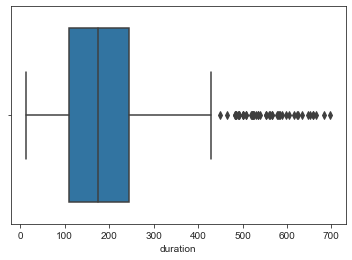

In [63]:
sns.boxplot(routes_cleaned.groupby('truck_id')['duration'].sum())

In [64]:
routes_cleaned.groupby('truck_id')['duration'].sum().mean() * 2

447.1486638764051

In [65]:
# total available hours
180 * 24 * 200

864000

In [66]:
# total duration of trips
routes_cleaned['duration'].sum()*2

111787.1659691013

In [67]:
# average % of use of each truck
routes_cleaned['duration'].sum()*2 /(180 * 24 * 200)

# way too much trucks : they ride 12% of the time.
# We could expect around 40% of utilization

0.1293832939457191

# Daily analysis

In [68]:
# daily analysis
# we chose to study the day with the highest volume of packages to deliver

In [69]:
routes_used_per_day = (used_tracks
                       .groupby(['routes','date','start','stop', 'from_warehouse'])
                       .agg({'routes':'count'})
                       .rename(columns={'routes':'nb_routes'})
                       .sort_values("nb_routes"))

routes_used_per_day = routes_used_per_day.reset_index()

In [70]:
routes_cleaned.groupby(by='route_date')['fill_volume'].sum().idxmax()

'2021-05-10'

In [71]:
# first we draw the France on one day to see if we can improve our transportation netwok on a daily basis

In [72]:
day_routes = routes_used_per_day[routes_used_per_day['date']=='2021-05-10']

In [73]:
routes_used_day = (day_routes
               .groupby(['routes','start','stop', 'from_warehouse'])
               .agg({'routes':'count'})
               .rename(columns={'routes':'nb_routes'})
               .sort_values("nb_routes"))

routes_used_day = pd.merge(routes_used_day.reset_index(), cities[['city','lat','lng']], 
                       left_on='start',right_on='city')

routes_used_day = (routes_used_day
               .rename(columns={'lat':'lat_start','lng':'lng_start'})
               .drop(columns=['city']))

routes_used_day = pd.merge(routes_used_day.reset_index(), cities[['city','lat','lng']], 
                       left_on='stop',right_on='city')

routes_used_day = (routes_used_day
               .rename(columns={'lat':'lat_stop','lng':'lng_stop'})
               .drop(columns=['city']))

routes_used_day.head()

,index,routes,start,stop,from_warehouse,nb_routes,lat_start,lng_start,lat_stop,lng_stop
0,0,Annecy - Aix-en-Provence,Annecy,Aix-en-Provence,Avignon,1,45.9160,6.1330,43.5263,5.4454
1,1,Nice - Montélimar,Nice,Montélimar,Avignon,1,43.7034,7.2663,44.5581,4.7508
2,2,Nanterre - Montreuil,Nanterre,Montreuil,Cergy,1,48.8988,2.1969,48.8611,2.4436
3,3,Nancy - Mulhouse,Nancy,Mulhouse,Reims,1,48.6936,6.1846,47.7500,7.3400
4,46,Reims - Mulhouse,Reims,Mulhouse,Reims,1,49.2628,4.0347,47.7500,7.3400


In [74]:
pck_volume_per_city = orders[orders['delivered_date']=='2021-05-10 00:00:00'].groupby('delivery_location').aggregate({'order_total_volume':'sum'}).sort_values('order_total_volume',ascending=False)
pck_volume_per_city = pd.merge(cities,pck_volume_per_city, left_on='city', right_index=True)

pck_volume_per_city['text'] = pck_volume_per_city['city'] + ', ' + 'Order_total_volume: ' + round(pck_volume_per_city['order_total_volume']).astype(str)

In [75]:
pck_volume_per_city.head()

,city,lat,lng,country,iso2,admin_name,capital,population,population_proper,is_warehouse,order_total_volume,text
0,Paris,48.8566,2.3522,France,FR,Île-de-France,primary,11020000.0,2148271.0,False,0.6615,"Paris, Order_total_volume: 1.0"
1,Nice,43.7034,7.2663,France,FR,Provence-Alpes-Côte d’Azur,minor,1006402.0,341032.0,False,11.4832,"Nice, Order_total_volume: 11.0"
2,Toulouse,43.6045,1.4440,France,FR,Occitanie,admin,968638.0,486828.0,False,1.2965,"Toulouse, Order_total_volume: 1.0"
3,Marseille,43.2964,5.3700,France,FR,Provence-Alpes-Côte d’Azur,admin,870018.0,868277.0,False,47.7708,"Marseille, Order_total_volume: 48.0"
4,Rennes,48.1147,-1.6794,France,FR,Bretagne,admin,727357.0,217728.0,False,52.7833,"Rennes, Order_total_volume: 53.0"


In [76]:
import plotly.graph_objects as go


trace = go.Choropleth(
    locations=geo_data['code'],
    geojson=french_counties,
    autocolorscale=False,
    z=geo_data['value'],
    featureidkey='properties.code', 
    showscale=False,
    marker_line_color='black',
    colorscale=[[0, "rgb(255,255,255)"],
                [1, "rgb(240,240,240)"]],
    showlegend=False)

fig = go.Figure(data=trace)

for i in range(len(routes_used_day)):
    fig.add_trace(go.Scattergeo(
                        lat = [routes_used_day.lat_start[i],routes_used_day.lat_stop[i]],
                        lon = [routes_used_day.lng_start[i],routes_used_day.lng_stop[i]],
                        mode = 'lines',
                        line = dict(width = routes_used_day.nb_routes[i], color="grey"), 
                        showlegend=False
                        ))


fig.add_trace(go.Scattergeo(
        lon = pck_volume_per_city['lng'],
        lat = pck_volume_per_city['lat'],
        mode = 'markers',
        geojson= french_counties,
        text = pck_volume_per_city['text'],
        marker_color = pck_volume_per_city['order_total_volume'],
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = False,
            autocolorscale = False,
            symbol = 'square',
            line = dict(width=1,
                        color='rgba(102, 102, 102)'),
            colorscale = 'Reds',
            cmin = 150,
            color = pck_volume_per_city['order_total_volume'],
            cmax = pck_volume_per_city['order_total_volume'].max(),
            colorbar_title="Total Volume delivered<br>"),
        showlegend=False),
            )

fig.update_geos(fitbounds="locations", 
                visible=False,
                landcolor = "rgb(240, 240, 240)",)

fig.update_layout(
        title = 'Most used routes by LPD',
        geo_scope='europe',
    )

In [77]:
# optimize roads on a daily basis
# we optimize for example the Cergy delivery network

In [78]:
cergy_routes = routes_used_day[routes_used_day['from_warehouse']=='Cergy']

In [79]:
pck_volume_per_city = orders[(orders['delivered_date']=='2021-05-10 00:00:00') & (orders['from_warehouse']=='Cergy')].groupby('delivery_location').aggregate({'order_total_volume':'sum'}).sort_values('order_total_volume',ascending=False)
pck_volume_per_city = pd.merge(cities,pck_volume_per_city, left_on='city', right_index=True)

pck_volume_per_city['text'] = pck_volume_per_city['city'] + ', ' + 'Order_total_volume: ' + round(pck_volume_per_city['order_total_volume']).astype(str)

In [80]:
# we build our graph

# source at Cergy, total volume of the day to deliver
# sinks at every stop that absorb the volume of the orders

In [81]:
import numpy as np
import pandas as pd
import pulp
import itertools

In [82]:
cities[cities['city']=='Cergy'].head()

,city,lat,lng,country,iso2,admin_name,capital,population,population_proper,is_warehouse
74,Cergy,49.0361,2.0631,France,FR,Île-de-France,minor,65177.0,65177.0,True


In [83]:
# customer count ('0' is depot) 
customer_count = len(pck_volume_per_city)

# the number of vehicle
vehicle_count = 40

# the capacity of vehicle
vehicle_capacity = 5

# fix random seed
np.random.seed(seed=777)

# set depot latitude and longitude
depot_latitude = 49.0361
depot_longitude = 2.0631

In [84]:
# what is our location and demand of each customer ?
demand_and_location=pd.DataFrame()

demand_and_location['latitude'] = pck_volume_per_city['lat']
demand_and_location['longitude'] = pck_volume_per_city['lng']
demand_and_location['demand'] = pck_volume_per_city['order_total_volume']


demand_and_location.head()

,latitude,longitude,demand
0,48.8566,2.3522,0.6615
4,48.1147,-1.6794,52.7833
9,49.4428,1.0886,21.9904
13,48.3900,-4.4900,72.5480
16,47.9025,1.9090,62.1307


In [85]:
# set the depot as the center and make demand 0 ('0' = depot)
demand_and_location.loc[74] = depot_latitude
demand_and_location.loc[74].longitude = depot_longitude
demand_and_location.loc[74].demand = 0

In [86]:
demand_and_location = demand_and_location.sort_values(by='demand', ascending=True)

In [87]:
demand_and_location = demand_and_location.reset_index()

del demand_and_location['index']

demand_and_location.head()

,latitude,longitude,demand
0,49.0361,2.0631,0.0000
1,48.9108,2.2889,0.0940
2,48.9500,2.2500,0.1846
3,48.8566,2.3522,0.6615
4,48.8611,2.4436,1.6341


In [88]:
from math import radians, sin, cos, asin, acos, sqrt

In [89]:
# distance between two points
def distance_Haversine(lat1, lat2, lon1, lon2):

    lon1 = radians(lon1)
    lon2 = radians(lon2)
    lat1 = radians(lat1)
    lat2 = radians(lat2)
      
    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
 
    c = 2 * asin(sqrt(a))
    
    # Radius of earth in kilometers. Use 3956 for miles
    r = 6371
      
    # calculate the result
    return(c * r)

# function for calculating distance between two pins
def _distance_calculator(_df):
    
    _distance_result = np.zeros((len(_df),len(_df)))
    _df['latitude-longitude'] = '0'
    for i in range(len(_df)):
        _df['latitude-longitude'].iloc[i] = str(_df.latitude[i]) + ',' + str(_df.longitude[i])
    
    for i in range(len(_df)):
        for j in range(len(_df)):

            _res = distance_Haversine(_df['latitude'].iloc[i], _df['latitude'].iloc[j], _df['longitude'].iloc[i], _df['longitude'].iloc[j])
            
            # append distance to result list
            _distance_result[i][j] = _res
    
    return _distance_result



distance = _distance_calculator(demand_and_location)

C:\Users\Administrateur\anaconda3\envs\geo_env\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# OPTIMIZER

In [90]:
pip install ortools

Note: you may need to restart the kernel to use updated packages.


In [91]:
routes_used_per_day = (used_tracks
                       .groupby(['routes','date','start','stop', 'from_warehouse'])
                       .agg({'routes':'count'})
                       .rename(columns={'routes':'nb_routes'})
                       .sort_values("nb_routes"))

routes_used_per_day = routes_used_per_day.reset_index()

In [92]:
routes_cleaned.groupby(by='route_date')['fill_volume'].sum().idxmax()

'2021-05-10'

In [93]:
day_routes = routes_used_per_day[routes_used_per_day['date']=='2021-05-10']

In [94]:
routes_used_day = (day_routes
               .groupby(['routes','start','stop', 'from_warehouse'])
               .agg({'routes':'count'})
               .rename(columns={'routes':'nb_routes'})
               .sort_values("nb_routes"))

routes_used_day = pd.merge(routes_used_day.reset_index(), cities[['city','lat','lng']], 
                       left_on='start',right_on='city')

routes_used_day = (routes_used_day
               .rename(columns={'lat':'lat_start','lng':'lng_start'})
               .drop(columns=['city']))

routes_used_day = pd.merge(routes_used_day.reset_index(), cities[['city','lat','lng']], 
                       left_on='stop',right_on='city')

routes_used_day = (routes_used_day
               .rename(columns={'lat':'lat_stop','lng':'lng_stop'})
               .drop(columns=['city']))

routes_used_day.head()

,index,routes,start,stop,from_warehouse,nb_routes,lat_start,lng_start,lat_stop,lng_stop
0,0,Annecy - Aix-en-Provence,Annecy,Aix-en-Provence,Avignon,1,45.9160,6.1330,43.5263,5.4454
1,1,Nice - Montélimar,Nice,Montélimar,Avignon,1,43.7034,7.2663,44.5581,4.7508
2,2,Nanterre - Montreuil,Nanterre,Montreuil,Cergy,1,48.8988,2.1969,48.8611,2.4436
3,3,Nancy - Mulhouse,Nancy,Mulhouse,Reims,1,48.6936,6.1846,47.7500,7.3400
4,46,Reims - Mulhouse,Reims,Mulhouse,Reims,1,49.2628,4.0347,47.7500,7.3400


In [95]:
pck_volume_per_city = orders[orders['delivered_date']=='2021-05-10 00:00:00'].groupby('delivery_location').aggregate({'order_total_volume':'sum'}).sort_values('order_total_volume',ascending=False)
pck_volume_per_city = pd.merge(cities,pck_volume_per_city, left_on='city', right_index=True)

pck_volume_per_city['text'] = pck_volume_per_city['city'] + ', ' + 'total_order_volume: ' + round(pck_volume_per_city['order_total_volume']).astype(str)

In [96]:
# optimize roads on a daily basis
# we optimize for example the Cergy delivery network

In [97]:
cergy_routes = routes_used_day[routes_used_day['from_warehouse']=='Cergy']

In [98]:
pck_volume_per_city = orders[(orders['delivered_date']=='2021-05-10 00:00:00') & (orders['from_warehouse']=='Cergy')].groupby('delivery_location').aggregate({'order_total_volume':'sum'}).sort_values('order_total_volume',ascending=False)
pck_volume_per_city = pd.merge(cities,pck_volume_per_city, left_on='city', right_index=True)

pck_volume_per_city['text'] = pck_volume_per_city['city'] + ', ' + 'Package_Volume: ' + round(pck_volume_per_city['order_total_volume']).astype(str)

In [99]:
# customer count ('0' is depot) 
customer_count = len(pck_volume_per_city)

# the number of vehicle
vehicle_count = 50

# the capacity of vehicle
vehicle_capacity = 5

# fix random seed
np.random.seed(seed=777)

# set depot latitude and longitude
depot_latitude = 49.0361
depot_longitude = 2.0631

In [100]:
# what is our location and demand of each customer ?
demand_and_location=pd.DataFrame()

demand_and_location['latitude'] = pck_volume_per_city['lat']
demand_and_location['longitude'] = pck_volume_per_city['lng']
demand_and_location['demand'] = pck_volume_per_city['order_total_volume']
demand_and_location['city'] = pck_volume_per_city['city']



demand_and_location.head()

,latitude,longitude,demand,city
0,48.8566,2.3522,0.6615,Paris
4,48.1147,-1.6794,52.7833,Rennes
9,49.4428,1.0886,21.9904,Rouen
13,48.3900,-4.4900,72.5480,Brest
16,47.9025,1.9090,62.1307,Orléans


In [101]:
# set the depot as the center and make demand 0 ('0' = depot)
demand_and_location.loc[demand_and_location['city']=='Cergy', 'latitude'] = depot_latitude
demand_and_location.loc[demand_and_location['city']=='Cergy', 'longitude'] = depot_longitude
demand_and_location.loc[demand_and_location['city']=='Cergy','demand'] = 0

In [102]:
demand_and_location = demand_and_location.sort_values(by='demand', ascending=True)

In [103]:
demand_and_location = demand_and_location.reset_index()

del demand_and_location['index']

demand_and_location.head()

,latitude,longitude,demand,city
0,49.0361,2.0631,0.0000,Cergy
1,48.9108,2.2889,0.0940,Carrières-sur-Seine
2,48.9500,2.2500,0.1846,Argenteuil
3,48.8566,2.3522,0.6615,Paris
4,48.8611,2.4436,1.6341,Montreuil


In [104]:
from math import radians, sin, cos, asin, acos, sqrt

In [105]:
# distance between two points
def distance_Haversine(lat1, lat2, lon1, lon2):

    lon1 = radians(lon1)
    lon2 = radians(lon2)
    lat1 = radians(lat1)
    lat2 = radians(lat2)
      
    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
 
    c = 2 * asin(sqrt(a))
    
    # Radius of earth in kilometers. Use 3956 for miles
    r = 6371
      
    # calculate the result
    return(c * r)

# function for calculating distance between two pins
def _distance_calculator(_df):
    
    _distance_result = np.zeros((len(_df),len(_df)))
    _df['latitude-longitude'] = '0'
    for i in range(len(_df)):
        _df['latitude-longitude'].iloc[i] = str(_df.latitude[i]) + ',' + str(_df.longitude[i])
    
    for i in range(len(_df)):
        for j in range(len(_df)):

            _res = distance_Haversine(_df['latitude'].iloc[i], _df['latitude'].iloc[j], _df['longitude'].iloc[i], _df['longitude'].iloc[j])
            
            # append distance to result list
            _distance_result[i][j] = _res
    
    return _distance_result



distance = _distance_calculator(demand_and_location)

C:\Users\Administrateur\anaconda3\envs\geo_env\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [106]:
# customer count ('0' is depot) 
customer_count = len(distance)

# the number of vehicle
vehicle_count = 7

# the capacity of vehicle
vehicle_capacity = 83

# fix random seed
np.random.seed(seed=777)

# set depot latitude and longitude
depot_latitude = 49.0361
depot_longitude = 2.0631

In [107]:
import pyproj as proj

# setup your projections
crs_wgs = proj.Proj(init='epsg:4326') # assuming you're using WGS84 geographic
crs_bng = proj.Proj(init='epsg:27700') # use a locally appropriate projected CRS

C:\Users\Administrateur\anaconda3\envs\geo_env\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6

C:\Users\Administrateur\anaconda3\envs\geo_env\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6



C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_9496/2885979628.py:18: DeprecationWarning:

This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_9496/2885979628.py:20: DeprecationWarning:

This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_9496/2885979628.py:32: DeprecationWarning:

This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_9496/2885979628.py:33: DeprecationWarning:

This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_9496/2885979628.py:36: DeprecationWarning:

This function is deprecated. See: https://pyproj4

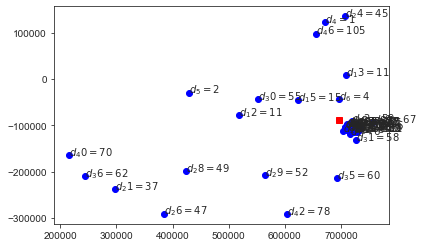

In [108]:
#Importing the package numpy as np.
import numpy as np

# Number of customers.
n = 48
# Maximum capacity of the vehicle.
Q = 85*40

#The set of nodes without the depot.
N = [i for i in range(1,n+1)]
# The set of nodes + the depot.
V = [0]+ N
# A collection that contains the demand of each node.
d ={i:demand_and_location.demand[i] for i in N}


# Generating random numbers between (0 and 15) * 200.
loc_x = [proj.transform(crs_wgs, crs_bng,demand_and_location.longitude[i], demand_and_location.latitude[i])[0] for i in N]
# Generating random numbers between (0 and 15) * 100.
loc_y = [proj.transform(crs_wgs, crs_bng,demand_and_location.longitude[i], demand_and_location.latitude[i])[1] for i in N]


#Importing the package matplotlib.pyplot as plt.
import matplotlib.pyplot as plt
#Plotting the n nodes without the node 0 (depot) and chose the color blue for each node.
plt.scatter(loc_x[1:],loc_y[1:],c='b')

for i in range(1,len(N)):
  plt.annotate('$d_%d=%d$'%(i,d[i]),(loc_x[i],loc_y[i]))

#Ploting the node 0, chosing the red like its color and the square form like a marker.
plt.plot(proj.transform(crs_wgs, crs_bng,demand_and_location.longitude[0], demand_and_location.latitude[0])[0],
         proj.transform(crs_wgs, crs_bng,demand_and_location.longitude[0], demand_and_location.latitude[0])[1],c='r' ,marker='s')


loc_x = [proj.transform(crs_wgs, crs_bng,demand_and_location.longitude[0], demand_and_location.latitude[0])[0]] + loc_x
loc_y = [proj.transform(crs_wgs, crs_bng,demand_and_location.longitude[0], demand_and_location.latitude[0])[1]] + loc_y
#Showing the Initial plot.
plt.show()

In [109]:
dict_mapping = {demand_and_location['city'][i]: demand_and_location.index[i] for i in range(len(demand_and_location))}

In [110]:
edges_cergy_day = cergy_routes[['start', 'stop']]

edges_cergy_day['start'] = edges_cergy_day['start'].map(dict_mapping)
edges_cergy_day['stop'] = edges_cergy_day['stop'].map(dict_mapping)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_9496/3695945190.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_9496/3695945190.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [111]:
width_cergy_day = cergy_routes['nb_routes'].tolist()

In [112]:
edges_cergy = edges_cergy_day.values

In [113]:
demand_and_location.head()

,latitude,longitude,demand,city,latitude-longitude
0,49.0361,2.0631,0.0000,Cergy,"49.0361,2.0631"
1,48.9108,2.2889,0.0940,Carrières-sur-Seine,"48.9108,2.2889"
2,48.9500,2.2500,0.1846,Argenteuil,"48.95,2.25"
3,48.8566,2.3522,0.6615,Paris,"48.8566,2.3522"
4,48.8611,2.4436,1.6341,Montreuil,"48.8611,2.4436"


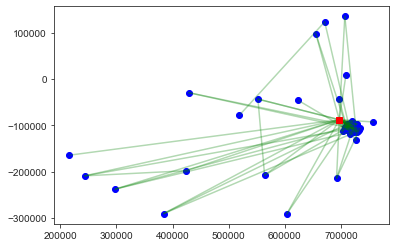

In [114]:
for item in edges_cergy :
  #Coloring the active arcs
  plt.plot([loc_x[item[0]],loc_x[item[1]]],[loc_y[item[0]],loc_y[item[1]]],c='g',alpha=0.3)

plt.plot(loc_x[0],loc_y[0],c='r' ,marker='s')
plt.scatter(loc_x[1:],loc_y[1:],c='b')

plt.show()

In [115]:
# we are now going to calculate the optimal edges/routes

In [116]:
A = [(i,j) for i in V for j in V if i!=j]

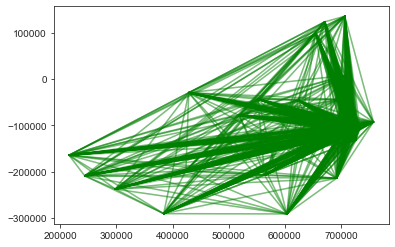

In [117]:
for i,j in A :
#Coloring the active arcs
  plt.plot([loc_x[i],loc_x[j]],[loc_y[i],loc_y[j]],c='g',alpha=0.3)

In [118]:
#Calculating the distance between each node.
c= {(i,j):np.hypot(loc_x[i]-loc_x[j],loc_y[i]-loc_y[j]) for i,j in A}

In [119]:
distance_matrixx = [[0]*49]*49

In [120]:
for key in c.keys():
    distance_matrixx[key[0]][key[1]]=c[key]

In [128]:
len(distance_matrixx)

49

In [130]:
# [START program]
"""Capacited Vehicles Routing Problem (CVRP)."""

# [START import]
from ortools.constraint_solver import routing_enums_pb2
from ortools.constraint_solver import pywrapcp
# [END import]


# [START data_model]
def create_data_model():
    """Stores the data for the problem."""
    data = {}
    data['distance_matrix'] = distance_matrixx[0:42][0:42]
    # [START demands_capacities]
    data['demands'] = demand_and_location.demand.astype(int).tolist()[0:42]
    data['vehicle_capacities'] = [85]*45
    # [END demands_capacities]
    data['num_vehicles'] = 45
    data['depot'] = 0
    return data
    # [END data_model]


# [START solution_printer]
def print_solution(data, manager, routing, solution):
    """Prints solution on console."""
    print(f'Objective: {solution.ObjectiveValue()}')
    total_distance = 0
    total_load = 0
    for vehicle_id in range(data['num_vehicles']):
        index = routing.Start(vehicle_id)
        plan_output = 'Route for vehicle {}:\n'.format(vehicle_id)
        route_distance = 0
        route_load = 0
        while not routing.IsEnd(index):
            node_index = manager.IndexToNode(index)
            route_load += data['demands'][node_index]
            plan_output += ' {0} Load({1}) -> '.format(node_index, route_load)
            previous_index = index
            index = solution.Value(routing.NextVar(index))
            route_distance += routing.GetArcCostForVehicle(
                previous_index, index, vehicle_id)
        plan_output += ' {0} Load({1})\n'.format(manager.IndexToNode(index),
                                                 route_load)
        plan_output += 'Distance of the route: {}m\n'.format(route_distance)
        plan_output += 'Load of the route: {}\n'.format(route_load)
        print(plan_output)
        total_distance += route_distance
        total_load += route_load
    print('Total distance of all routes: {}m'.format(total_distance))
    print('Total load of all routes: {}'.format(total_load))
    # [END solution_printer]

def get_edges(data, manager, routing, solution):
    """Prints solution on console."""

    route_vehicles = [[0]]*45

    for vehicle_id in range(data['num_vehicles']):

        index = routing.Start(vehicle_id)
        route_distance = 0
        route_load = 0
        while not routing.IsEnd(index):
            node_index = manager.IndexToNode(index)
            if node_index!=0:
                route_vehicles[vehicle_id] = route_vehicles[vehicle_id] + [node_index]
            
            previous_index = index
            index = solution.Value(routing.NextVar(index))           

        manager.IndexToNode(index)
        
    return route_vehicles

def main():
    """Solve the CVRP problem."""
    # Instantiate the data problem.
    # [START data]
    data = create_data_model()
    # [END data]

    # Create the routing index manager.
    # [START index_manager]
    manager = pywrapcp.RoutingIndexManager(len(data['distance_matrix']),
                                           data['num_vehicles'], data['depot'])
    # [END index_manager]

    # Create Routing Model.
    # [START routing_model]
    routing = pywrapcp.RoutingModel(manager)

    # [END routing_model]

    # Create and register a transit callback.
    # [START transit_callback]
    def distance_callback(from_index, to_index):
        """Returns the distance between the two nodes."""
        # Convert from routing variable Index to distance matrix NodeIndex.
        from_node = manager.IndexToNode(from_index)
        to_node = manager.IndexToNode(to_index)
        return data['distance_matrix'][from_node][to_node]

    transit_callback_index = routing.RegisterTransitCallback(distance_callback)
    # [END transit_callback]

    # Define cost of each arc.
    # [START arc_cost]
    routing.SetArcCostEvaluatorOfAllVehicles(transit_callback_index)

    # [END arc_cost]

    # Add Capacity constraint.
    # [START capacity_constraint]
    def demand_callback(from_index):
        """Returns the demand of the node."""
        # Convert from routing variable Index to demands NodeIndex.
        from_node = manager.IndexToNode(from_index)
        return data['demands'][from_node]

    demand_callback_index = routing.RegisterUnaryTransitCallback(
        demand_callback)
    routing.AddDimensionWithVehicleCapacity(
        demand_callback_index,
        0,  # null capacity slack
        data['vehicle_capacities'],  # vehicle maximum capacities
        True,  # start cumul to zero
        'Capacity')
    # [END capacity_constraint]

    # Setting first solution heuristic.
    # [START parameters]
    search_parameters = pywrapcp.DefaultRoutingSearchParameters()
    search_parameters.first_solution_strategy = (
        routing_enums_pb2.FirstSolutionStrategy.PATH_CHEAPEST_ARC)
    search_parameters.local_search_metaheuristic = (
        routing_enums_pb2.LocalSearchMetaheuristic.GUIDED_LOCAL_SEARCH)
    search_parameters.time_limit.FromSeconds(1)
    # [END parameters]

    # Solve the problem.
    # [START solve]
    solution = routing.SolveWithParameters(search_parameters)
    # [END solve]

    # Print solution on console.
    
    # [START print_solution]
    if solution:

        print_solution(data, manager, routing, solution)
        print('----------****---------')
        resul = get_edges(data, manager, routing, solution)
        
        return resul 
    else :
        print('bugged')
    # [END print_solution]


if __name__ == '__main__':
    resul = main()
# [END program]

Objective: 4910586
Route for vehicle 0:
 0 Load(0) ->  0 Load(0)
Distance of the route: 0m
Load of the route: 0

Route for vehicle 1:
 0 Load(0) ->  0 Load(0)
Distance of the route: 0m
Load of the route: 0

Route for vehicle 2:
 0 Load(0) ->  0 Load(0)
Distance of the route: 0m
Load of the route: 0

Route for vehicle 3:
 0 Load(0) ->  0 Load(0)
Distance of the route: 0m
Load of the route: 0

Route for vehicle 4:
 0 Load(0) ->  0 Load(0)
Distance of the route: 0m
Load of the route: 0

Route for vehicle 5:
 0 Load(0) ->  0 Load(0)
Distance of the route: 0m
Load of the route: 0

Route for vehicle 6:
 0 Load(0) ->  0 Load(0)
Distance of the route: 0m
Load of the route: 0

Route for vehicle 7:
 0 Load(0) ->  0 Load(0)
Distance of the route: 0m
Load of the route: 0

Route for vehicle 8:
 0 Load(0) ->  0 Load(0)
Distance of the route: 0m
Load of the route: 0

Route for vehicle 9:
 0 Load(0) ->  0 Load(0)
Distance of the route: 0m
Load of the route: 0

Route for vehicle 10:
 0 Load(0) ->  0 Lo

In [123]:
df = pd.DataFrame()

In [131]:
# getting the optimal edges
opt_edges_cergy = []
for item in resul:
    if len(item)>1:
        for k in range(len(item)-1):
            opt_edges_cergy+= [(item[k],item[k+1])]

In [ ]:
# for each vehicle need to get the plan

In [ ]:
# is route_vehicle working ? If yes I will plot the edges easily

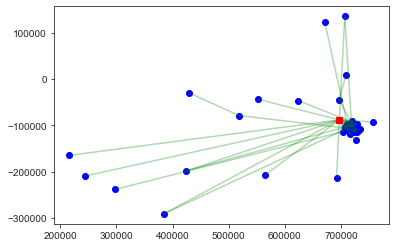

In [133]:
small_loc_x = loc_x[0:42]
small_loc_y = loc_y[0:42]

for item in opt_edges_cergy :
  #Coloring the active arcs
  plt.plot([loc_x[item[0]],loc_x[item[1]]],[loc_y[item[0]],loc_y[item[1]]],c='g',alpha=0.3)

plt.plot(loc_x[0],loc_y[0],c='r' ,marker='s')
plt.scatter(small_loc_x[1:],small_loc_y[1:],c='b')

plt.show()

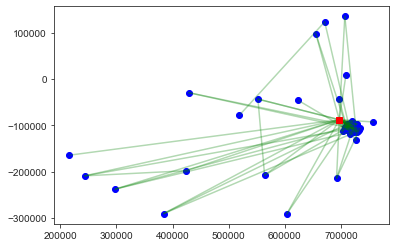

In [134]:
for item in edges_cergy :
  #Coloring the active arcs
  plt.plot([loc_x[item[0]],loc_x[item[1]]],[loc_y[item[0]],loc_y[item[1]]],c='g',alpha=0.3)

plt.plot(loc_x[0],loc_y[0],c='r' ,marker='s')
plt.scatter(loc_x[1:],loc_y[1:],c='b')

plt.show()

In [136]:
distance_not_opt = 0
for item in edges_cergy:
    distance_not_opt += distance_matrixx[item[0]][item[1]]

In [ ]:
4910586
7045739

In [137]:
distance_not_opt

7045739.29998443